In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

2024-04-02 22:05:34.870455: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-02 22:05:34.870548: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-02 22:05:34.998686: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
print(tf.__version__)

2.15.0


In [3]:
def get_paths(parent_folder):
    import os
    files={}
    for i in os.walk(parent_folder):
        if i[-1]:
            files[i[0]]=[]
#             image_name=i[-1][0] # take first image name because the last folder contains same image with different shapes.
#             files[i[0]].append(i[-1][0])
            for image_name in i[-1]:
                files[i[0]].append(image_name)
    paths=[]
    for parent_path  in files.keys() :
        for image_name in files[parent_path]:
            paths.append(os.path.join(parent_path,image_name))
    return paths

def remove_not_image_files(paths):
    for p in paths:
        if not p.endswith('.png') and  not p.endswith('.jpg') and not p.endswith('.jpeg'):
            paths.remove(p)

In [4]:
def preprocess_paths(parent_path):
    paths=get_paths(parent_path)
    n_paths_before=len(paths)
    remove_not_image_files(paths)
    n_paths_after=len(paths)
    print(f"{n_paths_before - n_paths_after} paths have been removed from {n_paths_before}")
    return paths

In [5]:
parent_folder ='/kaggle/input/101-arbic-roots'
paths=preprocess_paths(parent_folder)

0 paths have been removed from 2510


In [6]:
def get_ref_from_path(path,folder_position):
    if  path.startswith('/'):
        folder_position= folder_position+1
    return path.split('/')[folder_position]

In [7]:
def get_refs_from_paths(paths,folder_position):
    labels=[]
    for path in paths:
        labels.append(get_ref_from_path(path,folder_position))
    return labels

In [8]:
paths[1]

'/kaggle/input/101-arbic-roots/7/0/Image_24_Arabic Transparent_9572.png'

In [9]:
class_position_in_path=3
refs=get_refs_from_paths(paths,class_position_in_path)

In [10]:
def ref_to_label(refs:list):
    classes=sorted(list(set(refs)))
    labels = []
    for ref in refs:
        labels.append(str(classes.index(ref)))
    return labels
def prepare_dataframe(paths,refs):
    """
    Role:
        - Prepare dataframe  that conatains the paths of the images and its corresponding labels.
    Inputs:
        - paths : list()
        - labels: list()
    Outputs:
        df : pd.Dataframe()
    """
    import pandas as pd
    labels = ref_to_label(refs)
    d = {'path': paths, 'ref':refs,'label':labels}
    df =pd.DataFrame.from_dict(d)
    return df
# test:
df =prepare_dataframe(paths,refs)
df

,path,ref,label
0,/kaggle/input/101-arbic-roots/7/5/Image_24_Ara...,7,63
1,/kaggle/input/101-arbic-roots/7/0/Image_24_Ara...,7,63
2,/kaggle/input/101-arbic-roots/7/0/Image_24_Ara...,7,63
3,/kaggle/input/101-arbic-roots/7/0/Image_24_Ara...,7,63
4,/kaggle/input/101-arbic-roots/47/2/Image_24_Ar...,47,41
...,...,...,...
2505,/kaggle/input/101-arbic-roots/93/3/Image_24_Ar...,93,89
2506,/kaggle/input/101-arbic-roots/93/1/Image_24_Ar...,93,89
2507,/kaggle/input/101-arbic-roots/93/6/Image_24_Ar...,93,89
2508,/kaggle/input/101-arbic-roots/93/6/Image_24_Ar...,93,89


## - Refs : The references or the codes of the roots 
## - Lables : The classes ()

In [11]:
df['ref'].value_counts()

ref
76    105
2     104
36     81
74     79
18     78
     ... 
97      2
91      1
22      1
96      1
8       1
Name: count, Length: 96, dtype: int64

In [12]:
threshold=20
nb_roots=(df['ref'].value_counts().values >threshold).sum()
print(f"we have [{nb_roots}] roots that have at least {threshold}")

we have [45] roots that have at least 20


###  Taking roots that have more than 20 images:

In [13]:
df['ref'].value_counts()[(df['ref'].value_counts().values >20)].index

Index(['76', '2', '36', '74', '18', '31', '34', '0', '90', '67', '5', '35',
       '69', '26', '1', '71', '58', '55', '4', '21', '48', '94', '13', '70',
       '19', '16', '25', '73', '3', '52', '6', '80', '99', '66', '32', '75',
       '17', '92', '15', '41', '78', '72', '40', '86', '11'],
      dtype='object', name='ref')

In [14]:
roots_sup_20 = df['ref'].value_counts()[(df['ref'].value_counts().values >20)].index

In [15]:
df_sup_20 = df[df['ref'].isin(roots_sup_20)]
df_sup_20

,path,ref,label
24,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,10
25,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,10
26,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,10
27,/kaggle/input/101-arbic-roots/17/2/4.png,17,10
28,/kaggle/input/101-arbic-roots/17/2/1.png,17,10
...,...,...,...
2491,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,67
2492,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,67
2493,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,67
2494,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,67


In [16]:
df_sup_20['ref'].value_counts()

ref
76    105
2     104
36     81
74     79
18     78
31     64
34     60
67     59
90     59
0      59
5      55
35     53
69     52
26     50
1      44
71     42
58     40
55     40
4      39
48     38
21     38
19     37
13     37
70     37
94     37
16     36
73     35
25     35
3      35
52     33
6      32
80     31
99     31
17     30
75     30
32     30
92     30
66     30
15     28
41     27
78     27
72     27
40     25
86     23
11     22
Name: count, dtype: int64

In [17]:
df_sup_20 =prepare_dataframe(df_sup_20['path'],df_sup_20['ref'])
df_sup_20

,path,ref,label
24,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
25,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
26,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
27,/kaggle/input/101-arbic-roots/17/2/4.png,17,6
28,/kaggle/input/101-arbic-roots/17/2/1.png,17,6
...,...,...,...
2491,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2492,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2493,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2494,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34


# Exploaratory data analysis

## Class Distribution 

In [18]:
#plot function
def show_plot(path):
    import matplotlib.pyplot as plt
    img = plt.imread(path)
    plt.imshow(img)

In [19]:
#plot function
def plot_distribution(classe_names,distribution,subset_name):
    plt.style.use('seaborn-dark-palette')
    classes=classe_names
    values =distribution
    plt.figure(figsize = (20, 5))
    plt.bar(classes, values,width = 0.7)

    plt.xlabel("Root references")
    plt.ylabel("Nb. words")
    plt.title(f"Repartition of {sum(values)} words for {nb_roots} in the {subset_name} data")
    def addlabels(x,y):
        for i in range(len(x)):
            plt.text(i, y[i], y[i], ha = 'center',color='black',style='italic',size="x-large")
    addlabels(classes,values)

## before splitting:

In [20]:
all_series = df['label'].value_counts()
all_values = all_series.values
all_keys = all_series.index

/tmp/ipykernel_26/1879729971.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


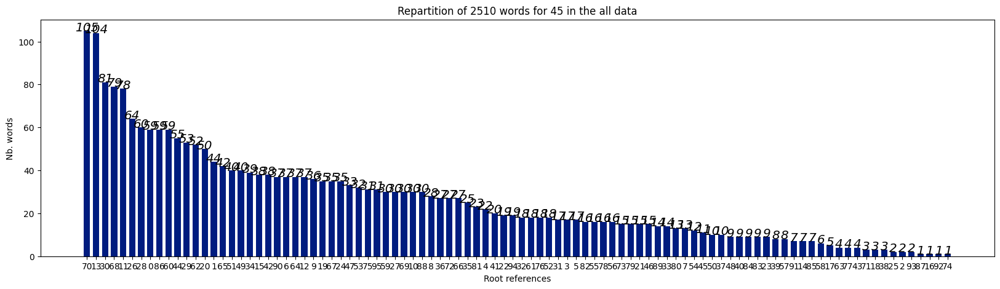

In [21]:
plot_distribution(all_keys,all_values,'all')

## EDA of data with refs that have more than threshold=20

In [22]:
series = df_sup_20['label'].value_counts()
values= series.values
keys = series.index

In [23]:
df_sup_20

,path,ref,label
24,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
25,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
26,/kaggle/input/101-arbic-roots/17/19/Image_24_A...,17,6
27,/kaggle/input/101-arbic-roots/17/2/4.png,17,6
28,/kaggle/input/101-arbic-roots/17/2/1.png,17,6
...,...,...,...
2491,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2492,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2493,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34
2494,/kaggle/input/101-arbic-roots/73/4/Image_24_Ar...,73,34


In [24]:
df_sup_20.label.unique()

array(['6', '8', '9', '17', '42', '23', '18', '21', '15', '11', '24',
       '36', '43', '25', '0', '14', '31', '16', '7', '29', '38', '28',
       '33', '5', '3', '44', '12', '35', '4', '13', '41', '30', '40',
       '32', '1', '26', '37', '19', '10', '20', '39', '27', '2', '22',
       '34'], dtype=object)

In [25]:
series = df_sup_20['ref'].value_counts()
values= series.values
keys = series.index

/tmp/ipykernel_26/1879729971.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


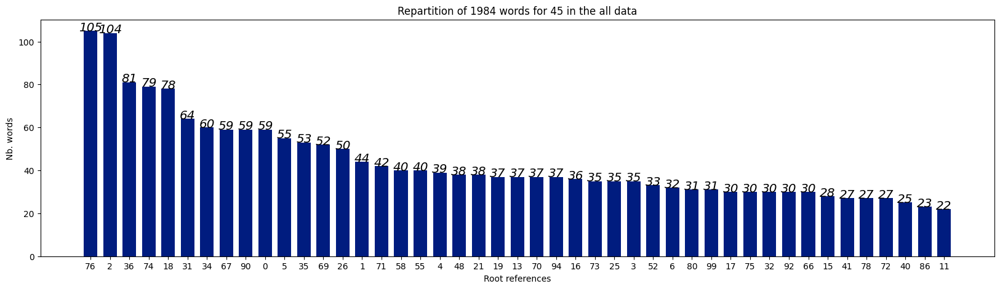

In [26]:
plot_distribution(keys,values,'all')

# split data :train ,test ,val

In [27]:
train_size = int(len(df)*0.8)
val_size = int(len(df)*0.1)
test_size = len(df) - train_size - val_size
assert train_size+val_size+test_size ==len(df)
(train_size,val_size,test_size)

(2008, 251, 251)

In [28]:
df_sup_20.shape

(1984, 3)

In [29]:
from sklearn.model_selection import train_test_split
train_df,test_df = train_test_split(df_sup_20,test_size=0.2,shuffle=True,stratify=df_sup_20['label'])
val_df,test_df = train_test_split(test_df,test_size=0.5,shuffle=True,stratify=test_df['label'])

# Train distribution

In [30]:
train_series = train_df['ref'].value_counts()
train_values = train_series.values
train_keys = train_series.index

/tmp/ipykernel_26/1879729971.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


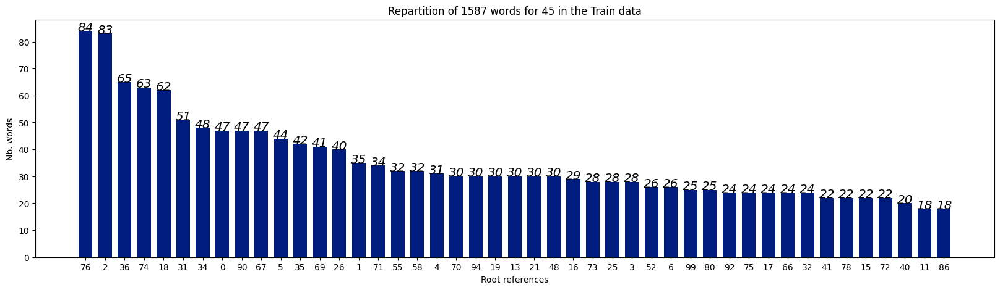

In [31]:
plot_distribution(train_keys,train_values,'Train')

# Validation distribution

In [32]:
val_series = val_df['ref'].value_counts()
val_values = val_series.values
val_keys = val_series.index

/tmp/ipykernel_26/1879729971.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


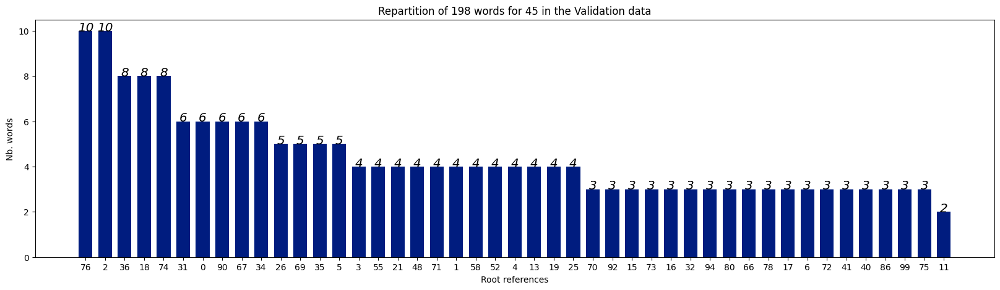

In [33]:
plot_distribution(val_keys,val_values,'Validation')

# Test data

In [34]:
test_series = test_df['ref'].value_counts()
test_values = test_series.values
test_keys = test_series.index

In [35]:
test_keys

Index(['76', '2', '36', '18', '74', '31', '5', '90', '34', '0', '35', '69',
       '67', '1', '26', '16', '48', '71', '21', '73', '4', '70', '55', '58',
       '94', '80', '6', '19', '25', '92', '75', '99', '3', '52', '17', '13',
       '15', '66', '32', '86', '78', '11', '40', '72', '41'],
      dtype='object', name='ref')

In [36]:
test_values

array([11, 11,  8,  8,  8,  7,  6,  6,  6,  6,  6,  6,  6,  5,  5,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  2,  2,  2,  2,  2,  2])

/tmp/ipykernel_26/1879729971.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


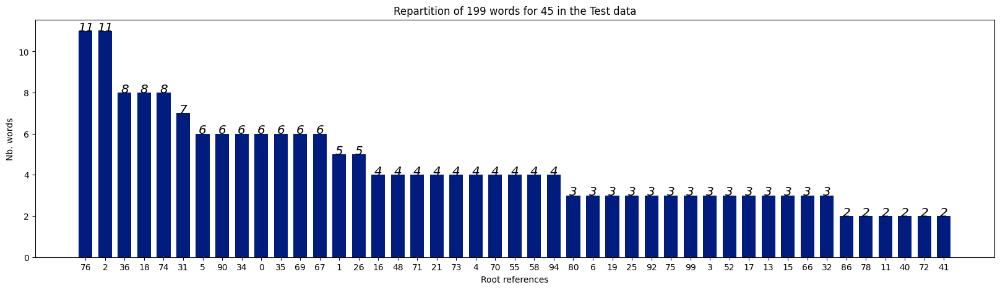

In [37]:
plot_distribution(test_keys,test_values,'Test')

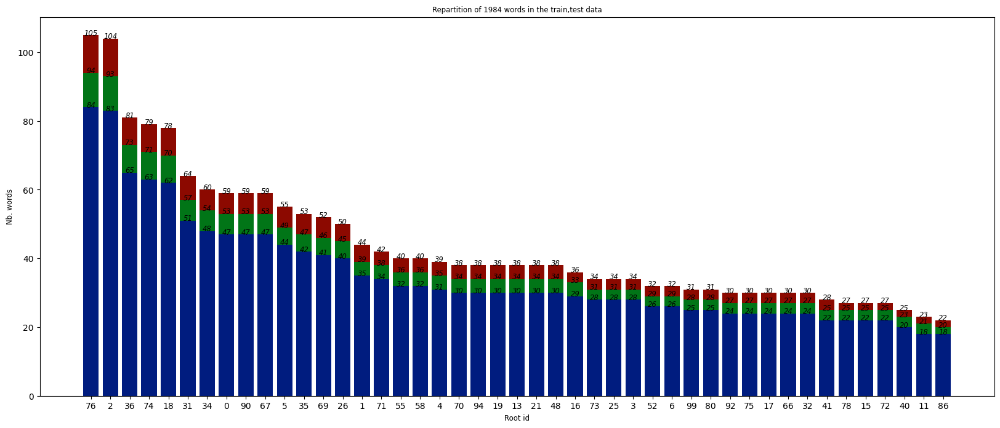

In [38]:
plt.figure(figsize=(20,8))
plt.bar(train_keys,train_values)
plt.bar(train_keys,val_values,bottom=train_values)
plt.bar(train_keys,test_values,bottom=train_values+val_values)
plt.xlabel("Root id",size="small")
plt.ylabel("Nb. words",size="small")
plt.title(f"Repartition of {sum(values)} words in the train,test data",size="small")
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center',color='black',style='italic',size="small")
addlabels(train_keys,train_values)
addlabels(train_keys,train_values+val_values)
addlabels(train_keys,train_values+val_values+test_values)
# plt.bar(train_keys,train_values)

## Load images and prepare lables

In [39]:
def reshape_image(img):
    import cv2
    import numpy as np
    (h, w) = img.shape
    
    final_img = np.ones([64, 256])*255 # blank white image
    
    # crop
    if w > 256:
        img = img[:, :256]
        
    if h > 64:
        img = img[:64, :]
        
    final_img[:h, 20:w+20] = img
    return cv2.rotate(final_img, cv2.ROTATE_90_CLOCKWISE)

def prepare_images(paths):
    import cv2
    import numpy as np
    images=[]
    for path in paths:
        im = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
        im = reshape_image(im)
        im = im/255.
        images.append(im)
    print(f"found {len(images)} images with {im.shape} shapes")
    return images

In [40]:
def prepare_xy(paths,labels):
    x = prepare_images(paths)
    y = tf.keras.utils.to_categorical(labels)
    return x ,y

### Train data

In [41]:
X_train,y_train =prepare_xy(train_df['path'],train_df['label']) 

found 1587 images with (256, 64) shapes


In [42]:
X_train[0].shape

(256, 64)

In [43]:
y_train.shape

(1587, 45)

In [44]:
X_train = np.array(X_train).reshape(-1,256,64,1)

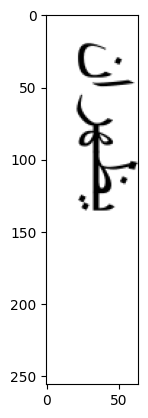

In [45]:
plt.imshow(X_train[0],cmap='gray')

In [46]:
y_train[:10]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 

# val data

In [47]:
X_val,y_val =prepare_xy(val_df['path'],val_df['label']) 

found 198 images with (256, 64) shapes


In [48]:
X_val = np.array(X_val).reshape(-1,256,64,1)

In [49]:
X_val.shape

(198, 256, 64, 1)

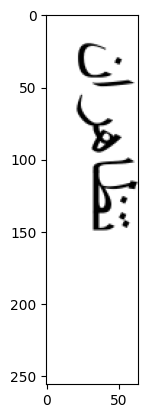

In [50]:
plt.imshow(X_val[0],cmap='gray')

In [51]:
y_val[:10]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 

# Test

In [52]:
X_test,y_test =prepare_xy(test_df['path'],test_df['label']) 

found 199 images with (256, 64) shapes


In [53]:
X_test = np.array(X_test).reshape(-1,256,64,1)

In [54]:
X_test.shape

(199, 256, 64, 1)

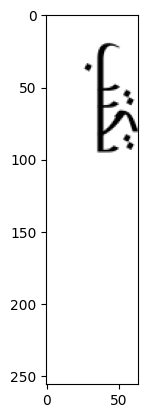

In [55]:
plt.imshow(X_test[0],cmap='gray')

In [56]:
y_test[:10]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0., 0., 0., 0., 

# Training

In [57]:
from tensorflow.keras.layers import Input,LSTM,Bidirectional,Dense,BatchNormalization,Activation,MaxPooling2D,Dropout,Reshape,Conv2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import F1Score , Precision , Accuracy, BinaryAccuracy,Recall , AUC

## Model

In [58]:
input_data = Input(shape=(256, 64, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)  
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm1')(inner)
inner = Bidirectional(LSTM(256, return_sequences=False), name = 'lstm2')(inner)

inner = Dense(1000, activation='relu', kernel_initializer='he_normal', name='dense2')(inner)
## OUTPUT
inner = Dense(nb_roots, kernel_initializer='he_normal',name='dense3')(inner)
y_pred = Activation('sigmoid', name='sigmoid')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 256, 64, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 256, 64, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 64, 32)    │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 256, 64, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max1 (MaxPooling2D)             │ (None, 128, 32, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 128, 32, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 32, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 128, 32, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max2 (MaxPooling2D)             │ (None, 64, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 64, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 64, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max3 (MaxPooling2D)             │ (None, 64, 8, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 8, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 64, 1024)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 64, 64)         │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm1 (Bidirectional)           │ (None, 64, 512)        │       657,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm2 (Bidirectional)           │ (None, 512)            │     1,574,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ (None, 1000)           │       513,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 45)             │        45,045 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sigmoid (Activation)            │ (None, 45)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,949,533 (11.25 MB)

 Trainable params: 2,949,085 (11.25 MB)

 Non-trainable params: 448 (1.75 KB)

In [59]:
# plot_model(model)

In [60]:
f1_scode=F1Score()
precision = Precision()
recall =Recall()
binary_accuracy=BinaryAccuracy()
accuracy = Accuracy()
auc = AUC()
metrics=[f1_scode,precision,recall,accuracy,binary_accuracy,auc]

In [61]:
model.compile(optimizer=Adam(1e-3),loss='binary_crossentropy',metrics=metrics)

In [62]:
X_train.shape

(1587, 256, 64, 1)

In [63]:
y_train.shape

(1587, 45)

In [64]:
history=model.fit(X_train,y_train,validation_data=(X_val,y_val),epochs=120,verbose=2)

Epoch 1/120


2024-04-02 22:06:13.280236: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_1_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


50/50 - 16s - 321ms/step - accuracy: 0.0000e+00 - auc: 0.5379 - binary_accuracy: 0.9701 - f1_score: 0.0097 - loss: 0.1325 - precision: 0.0226 - recall: 0.0082 - val_accuracy: 0.0000e+00 - val_auc: 0.5813 - val_binary_accuracy: 0.9778 - val_f1_score: 0.0021 - val_loss: 0.1082 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/120
50/50 - 2s - 46ms/step - accuracy: 0.0000e+00 - auc: 0.5640 - binary_accuracy: 0.9778 - f1_score: 0.0082 - loss: 0.1074 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_auc: 0.5830 - val_binary_accuracy: 0.9778 - val_f1_score: 0.0017 - val_loss: 0.1069 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/120
50/50 - 2s - 46ms/step - accuracy: 0.0000e+00 - auc: 0.5698 - binary_accuracy: 0.9778 - f1_score: 0.0059 - loss: 0.1069 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_auc: 0.5839 - val_binary_accuracy: 0.9778 - val_f1_score: 0.0021 - val_loss: 0.1074 - val_precision: 0.0000e+00 - 

# Results

In [65]:
history.history.keys()

dict_keys(['accuracy', 'auc', 'binary_accuracy', 'f1_score', 'loss', 'precision', 'recall', 'val_accuracy', 'val_auc', 'val_binary_accuracy', 'val_f1_score', 'val_loss', 'val_precision', 'val_recall'])

In [66]:
keys=['auc','binary_accuracy','f1_score','loss','precision', 'recall']

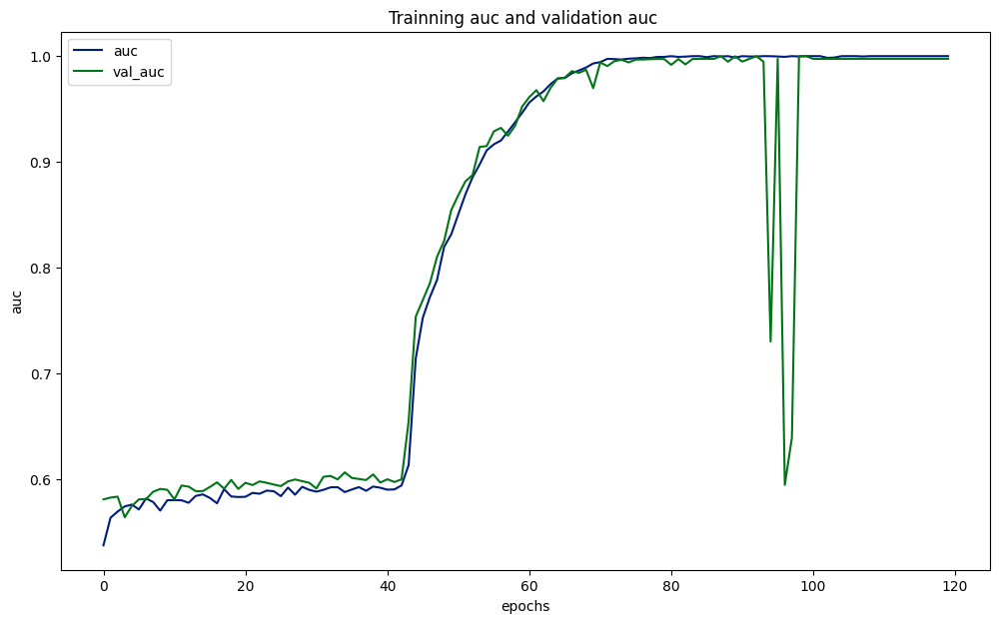

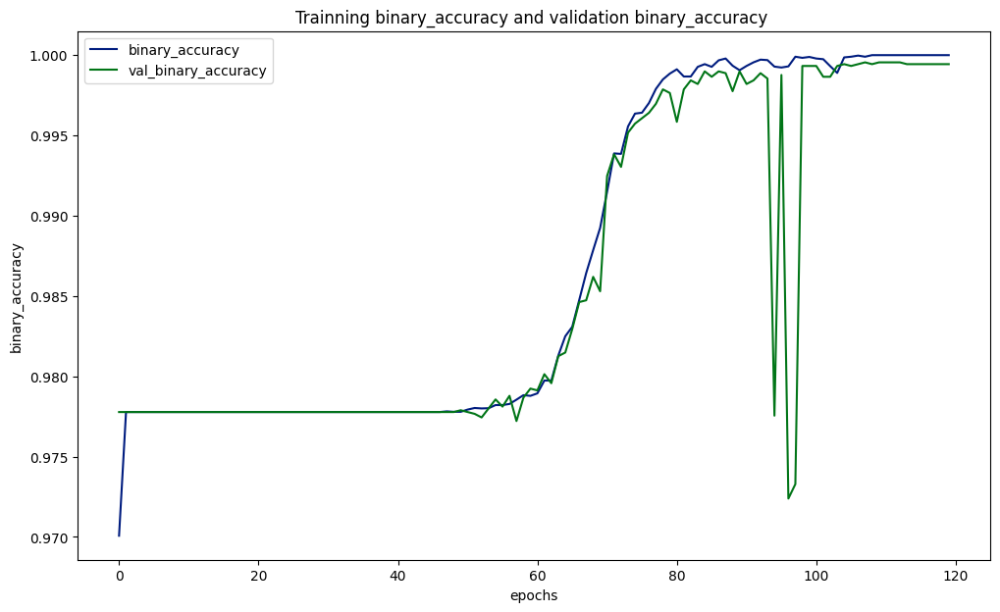

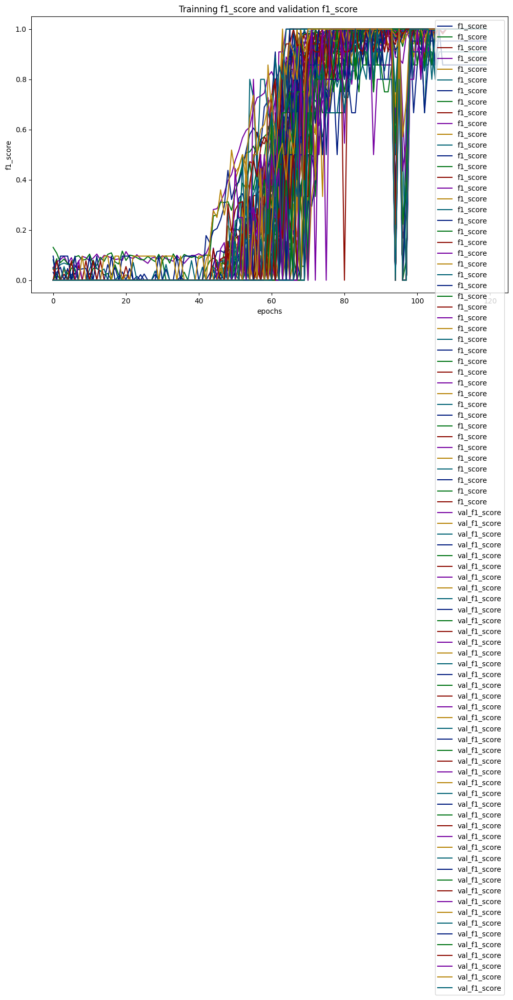

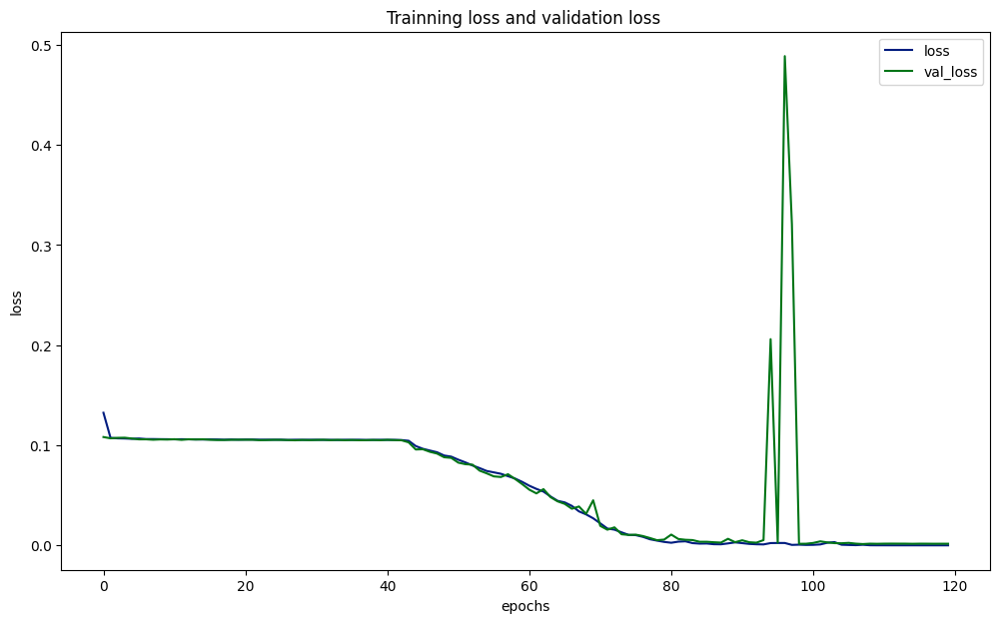

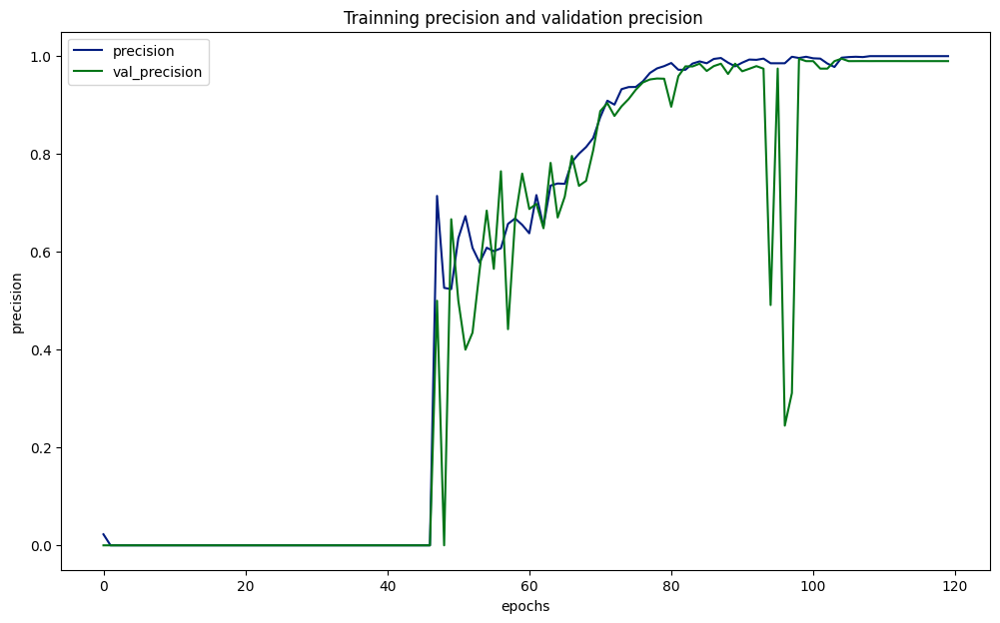

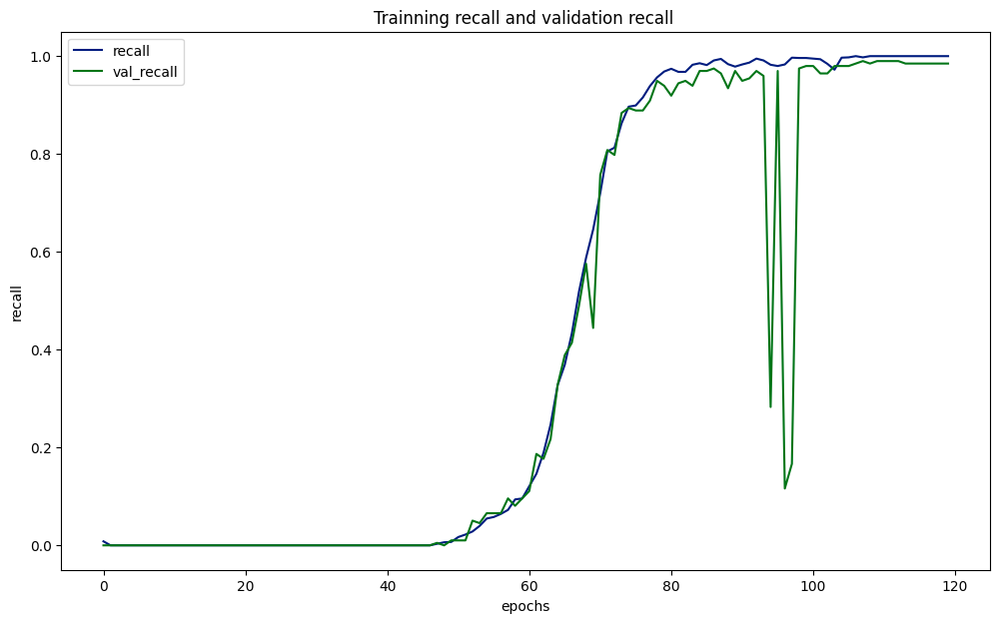

In [67]:
for key in keys:
    plt.figure(figsize=(12,7))
    plt.plot(history.history[key],label=key)
    plt.legend()
    plt.plot(history.history[f'val_{key}'],label=f'val_{key}')
    plt.legend()
    plt.title(f'Trainning {key} and validation {key} ')
    plt.xlabel('epochs')
    plt.ylabel(key)

# Testing on train data 

In [68]:
import cv2

In [69]:
res=model.evaluate(X_train,y_train)
res

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.0000e+00 - auc: 1.0000 - binary_accuracy: 1.0000 - f1_score: 0.9834 - loss: 7.6143e-06 - precision: 1.0000 - recall: 1.0000


[7.877129064581823e-06,
 0.0,
 1.0,
 1.0,
 <tf.Tensor: shape=(45,), dtype=float32, numpy=
 array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>,
 1.0,
 1.0]

In [70]:
#plot function
def plot_distribution(classe_names,distribution,subset_name):
    plt.style.use('seaborn-dark-palette')
    classes=classe_names
    values =distribution
    plt.figure(figsize = (20, 5))
    plt.bar(classes, values,width = 0.7)

    plt.xlabel("references")
    plt.ylabel("accuracy")
    plt.title("Accuracy by ref")
    def addlabels(x,y):
        for i in range(len(x)):
            plt.text(i, y[i], y[i], ha = 'center',color='black',style='italic',size="x-large")
    addlabels(classes,values)

In [71]:
np.argmax(y_train[0])

37

In [72]:
train_df.values[0]

array(['/kaggle/input/101-arbic-roots/76/0/Image_24_Arabic Transparent_1128.png',
       '76', '37'], dtype=object)

In [73]:
refs=[df_sup_20[df_sup_20.label.values==str(i)].ref.values[0] for i in range(nb_roots)] # refs have the same orders as labels  example refs[11]=25: [11 is the label or class] [25 is the ref]

/tmp/ipykernel_26/3348372120.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


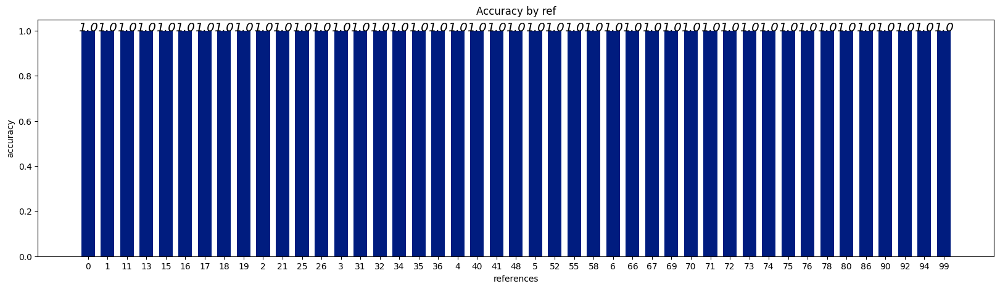

In [74]:
# plt.bar(np.array(res[4]),df_sup_20.label.unique())
plot_distribution(refs,np.round(np.array(res[4]),2),'Test') # res[4] contains the binary accuarcy for of each label

In [75]:
y_pred = model.predict(X_train)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


In [76]:
y_pred= [np.argmax(y) for y in y_pred]

In [77]:
plt.style.use('default')

In [78]:
def reshape_image(img):
    import cv2
    import numpy as np
    (h, w) = img.shape
    
    final_img = np.ones([64, 256])*255 # blank white image
    
    # crop
    if w > 256:
        img = img[:, :256]
        
    if h > 64:
        img = img[:64, :]
        
    final_img[:h, 20:w+20] = img
    return final_img

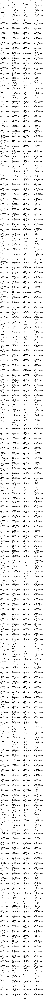

In [79]:
plt.figure(figsize=(15,350))
for i,x in enumerate(y_pred):
    plt.subplot(len(y_pred)//4 +1,4,i+1)
    plt.axis('off')
    im = cv2.imread(train_df['path'].values[i],cv2.IMREAD_GRAYSCALE)
    plt.imshow(reshape_image(im),cmap="gray")
    plt.title(f"pred is {y_pred[i]} for {train_df['label'].values[i]} with ref {train_df['ref'].values[i]}",pad=10)

# Testing on validation data

In [80]:
import cv2

In [81]:
res=model.evaluate(X_val,y_val)
res

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.0000e+00 - auc: 0.9946 - binary_accuracy: 0.9995 - f1_score: 0.9013 - loss: 0.0024 - precision: 0.9944 - recall: 0.9846


[0.0016227554297074676,
 0.0,
 0.9974678158760071,
 0.9994388222694397,
 <tf.Tensor: shape=(45,), dtype=float32, numpy=
 array([1.       , 1.       , 1.       , 1.       , 1.       , 1.       ,
        1.       , 1.       , 1.       , 0.9523809, 0.8571428, 1.       ,
        1.       , 1.       , 0.9090909, 1.       , 1.       , 1.       ,
        1.       , 1.       , 1.       , 0.8571428, 1.       , 1.       ,
        1.       , 1.       , 1.       , 1.       , 1.       , 1.       ,
        1.       , 1.       , 1.       , 1.       , 1.       , 1.       ,
        1.       , 1.       , 1.       , 1.       , 1.       , 1.       ,
        1.       , 1.       , 1.       ], dtype=float32)>,
 0.989847719669342,
 0.9848484992980957]

/tmp/ipykernel_26/3348372120.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


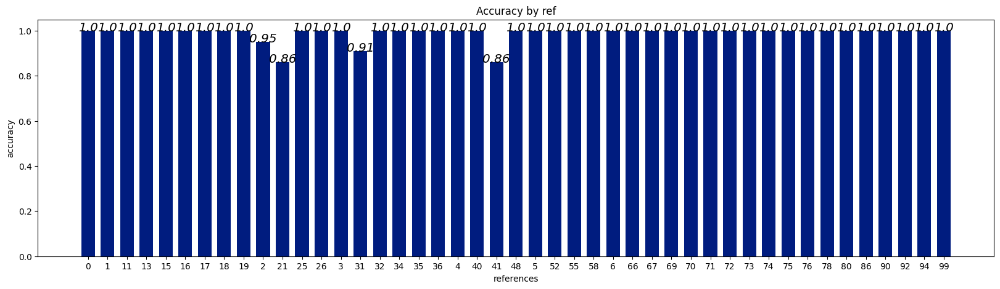

In [82]:
plot_distribution(refs,np.round(np.array(res[4]),2),'Test') # res[4] contains the binary accuarcy for of each label

In [83]:
y_pred = model.predict(X_val)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [84]:
y_pred= [np.argmax(y) for y in y_pred]

In [85]:
plt.style.use('default')

In [86]:
def reshape_image(img):
    import cv2
    import numpy as np
    (h, w) = img.shape
    
    final_img = np.ones([64, 256])*255 # blank white image
    
    # crop
    if w > 256:
        img = img[:, :256]
        
    if h > 64:
        img = img[:64, :]
        
    final_img[:h, 20:w+20] = img
    return final_img

In [87]:
val_df.shape

(198, 3)

In [88]:
len(y_pred)

198

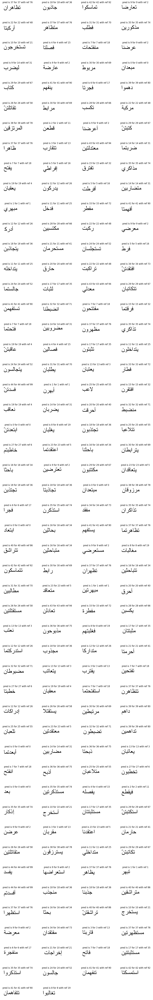

In [89]:
plt.figure(figsize=(15,100))
for i,x in enumerate(y_pred):
    plt.subplot(len(y_pred)//4 +1,4,i+1)
    plt.axis('off')
    im = cv2.imread(val_df['path'].values[i],cv2.IMREAD_GRAYSCALE)
    plt.imshow(reshape_image(im),cmap="gray")
    plt.title(f"pred is {y_pred[i]} for {val_df['label'].values[i]} with ref {val_df['ref'].values[i]}",pad=10)

# Testing on test data

In [90]:
import cv2

In [91]:
res=model.evaluate(X_test,y_test)
res

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.0000e+00 - auc: 1.0000 - binary_accuracy: 0.9999 - f1_score: 0.9033 - loss: 4.9333e-04 - precision: 1.0000 - recall: 0.9938


[0.0008313190191984177,
 0.0,
 0.9999988079071045,
 0.9997767210006714,
 <tf.Tensor: shape=(45,), dtype=float32, numpy=
 array([1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 0.9565217 ,
        1.        , 1.        , 1.        , 1.        , 0.92307687,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ],
       dtype=float32)>,
 1.0,
 0.9899497628211975]

/tmp/ipykernel_26/3348372120.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


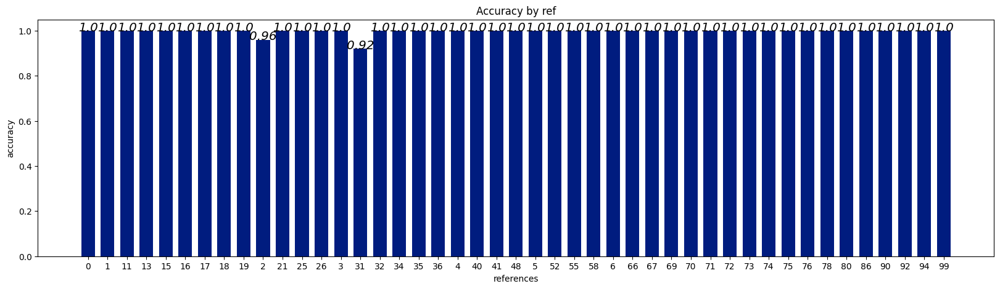

In [92]:
plot_distribution(refs,np.round(np.array(res[4]),2),'Test') # res[4] contains the binary accuarcy for of each label

In [93]:
y_pred = model.predict(X_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


In [94]:
y_pred= [np.argmax(y) for y in y_pred]

In [95]:
plt.style.use('default')

In [96]:
def reshape_image(img):
    import cv2
    import numpy as np
    (h, w) = img.shape
    
    final_img = np.ones([64, 256])*255 # blank white image
    
    # crop
    if w > 256:
        img = img[:, :256]
        
    if h > 64:
        img = img[:64, :]
        
    final_img[:h, 20:w+20] = img
    return final_img

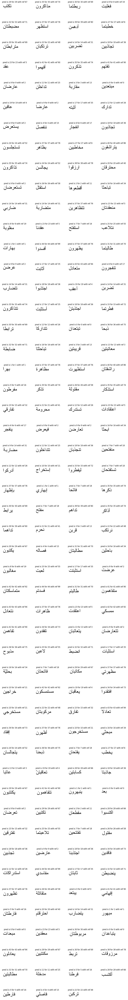

In [97]:
plt.figure(figsize=(15,120))
for i,x in enumerate(y_pred):
    plt.subplot(len(y_pred)//4 +1,4,i+1)
    plt.axis('off')
    im = cv2.imread(test_df['path'].values[i],cv2.IMREAD_GRAYSCALE)
    plt.imshow(reshape_image(im),cmap="gray")
    plt.title(f"pred is {y_pred[i]} for {test_df['label'].values[i]} with ref {test_df['ref'].values[i]}",pad=10)